# 06 Add An Overlay To An Interactive Map
---

Using the [`GeoPandas`](https://geopandas.org/index.html) and [`folium`](https://github.com/python-visualization/folium) packages to overlay a GeoDataFrame ontop of a leaflet map with an OS Maps API base map.

### Folium
---

The [folium](https://python-visualization.github.io/folium/) Python package provides a wrapper around the ubiquitous open-source JavaScript web mapping library [Leaflet.js](https://leafletjs.com/). It allows the visualisation of geospatial data in Python on an interactive leaflet map.

In [1]:
import geopandas as gpd
from datetime import datetime
from folium import Map
from folium.plugins import FloatImage
from shapely.geometry import box

###  Create GeoDataFrame from GeoPackage (GPKG)

In [2]:
# Create a GeoPandas GeoDataFrame from a GeoPackage (GPKG)
osogs = gpd.read_file(
    filename="../../data/ordnance-survey/os-open-greenspace-gb.gpkg",
    # GPKG layer
    layer="greenspace_site",
)

ERROR 1: PROJ: proj_create_from_database: Open of /cloud/lib/envs/training/share/proj failed


###  Spatially subset GeoDataFrame

Using coordinate-based indexer to spatially subset by bounding box (BBOX).

In [3]:
# Coordinate-based indexer to select by intersection with BBOX
# Greater London BBOX
osogs_filtered = osogs.cx[
    503568.1996:561957.4962, 155850.7975:200933.9026
]  # xmin:xmax, ymin:ymax

In [4]:
osogs.total_bounds, osogs_filtered.total_bounds

(array([   9819.84,    8274.57,  655229.5 , 1214133.19]),
 array([502292.05, 155102.  , 562996.91, 207036.4 ]))

Matplotlib created a temporary cache directory at /tmp/matplotlib-hnzvwivu because the default path (/home/rstudio-user/.config/matplotlib) is not a writable directory; it is highly recommended to set the MPLCONFIGDIR environment variable to a writable directory, in particular to speed up the import of Matplotlib and to better support multiprocessing.


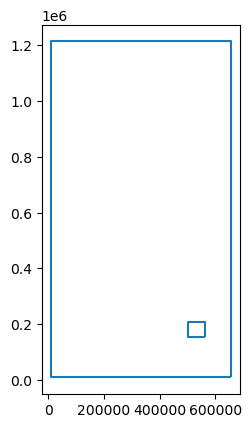

In [5]:
gpd.GeoDataFrame({'geometry':[box(*osogs_filtered.total_bounds).boundary,
                              box(*osogs.total_bounds).boundary]}).plot();

### OS Maps API ZXY resource

In [6]:
# OS Maps API layer name
# Example uses Light Style in Web Mercator (EPSG:3857) projection
layer = "Light_3857"
# OS Data Hub project API key
key = "frKhvBUiMB5DGwl3pGb2GzcOz6ApgyP0"

# OS Data Hub base path - https://api.os.uk
# OS Maps API ZXY end point path - /maps/raster/v1/zxy/
url = f"https://api.os.uk/maps/raster/v1/zxy/{layer}/{{z}}/{{x}}/{{y}}.png?key={key}"

In [7]:
# OS logo image
logo_url = "https://raw.githubusercontent.com/OrdnanceSurvey/os-api-branding/master/img/os-logo-maps.svg"

# Folium FloatImage plugin for displaying image on Map
image = FloatImage(logo_url, bottom=1, left=1)

In [8]:
# Return (x, y) centroid coordinates of dataset BBOX

# 1. Reproject dataset from British National Grid (BNG) / EPSG:27700 to WGS-84 / EPSG:4326
# 2. Return bounds of dataset
# 3. Create 'box' from bounds
# 4. Return 'box' centroid
# 5. Return 'box' centroid POINT x and y
centroid = list(box(*osogs_filtered.to_crs("epsg:4326").total_bounds).centroid.coords)[0]

centroid

(-0.09109760260681327, 51.5097803581478)

### Create custom Folium map

In [9]:
# Create Folium map
m = Map(
    # Map centre coordinates (by convention latitude (y), longitude (x))
    location=[
        centroid[1],
        centroid[0],
    ],  
    tiles=url,
    # OS Data Hub attribution statement
    attr=f"Contains OS data &copy; Crown copyright and database rights {datetime.now().year}",  
    # See EPSG:3857 Tile Matrix Set - https://osdatahub.os.uk/docs/wmts/technicalSpecification
    min_zoom=7,  
    max_zoom=16,
    zoom_start=12,
)

# Add image to Map
image.add_to(m)

### Plot GeoDataFrame ontop of folium map

In [10]:
# Add GeoDataFrame geometry to Folium map
osogs_filtered.explore(color="#00cd6c", m=m)